# Automatically generating object masks with SAM

Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

The class `SamAutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [1]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Setup

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [2]:
using_colab = False

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
    !{sys.executable} -m pip install openai

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

## Setup

In [4]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [5]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

## Generate Image

In [7]:
from openai import OpenAI
import requests

if using_colab:
  from google.colab import userdata
  import os
  os.environ['OPENAI_API_KEY'] = userdata.get('openai_key')

client = OpenAI()

response = client.images.generate(
  model='dall-e-3',
  prompt='A flying cow',
  n=1,
  size='1024x1024'
)

image_url = response.data[0].url
print(image_url)

image_response = requests.get(image_url)

image_name = 'generated_image'
image_path = f'images/{image_name}.png'
if image_response.status_code == 200:
    with open(image_path, "wb") as file:
        file.write(image_response.content)

    print(f'Image successfully downloaded and saved as {image_path}')
else:
    print('Failed to download the image')


https://oaidalleapiprodscus.blob.core.windows.net/private/org-cThnKDRxU5MpTYRUrYEM6mgy/user-xCRE3j2jr3zXHBnLCJ49w7cQ/img-HWfKUvNdnCDDN7h9noQABl61.png?st=2024-11-08T05%3A20%3A29Z&se=2024-11-08T07%3A20%3A29Z&sp=r&sv=2024-08-04&sr=b&rscd=inline&rsct=image/png&skoid=d505667d-d6c1-4a0a-bac7-5c84a87759f8&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-11-08T03%3A54%3A09Z&ske=2024-11-09T03%3A54%3A09Z&sks=b&skv=2024-08-04&sig=WWdta//UoxEhY%2BYA05plv4moVCiYlO6t/GLfevhOQtU%3D
Image successfully downloaded and saved as images/generated_image.png


## Example image

In [56]:
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

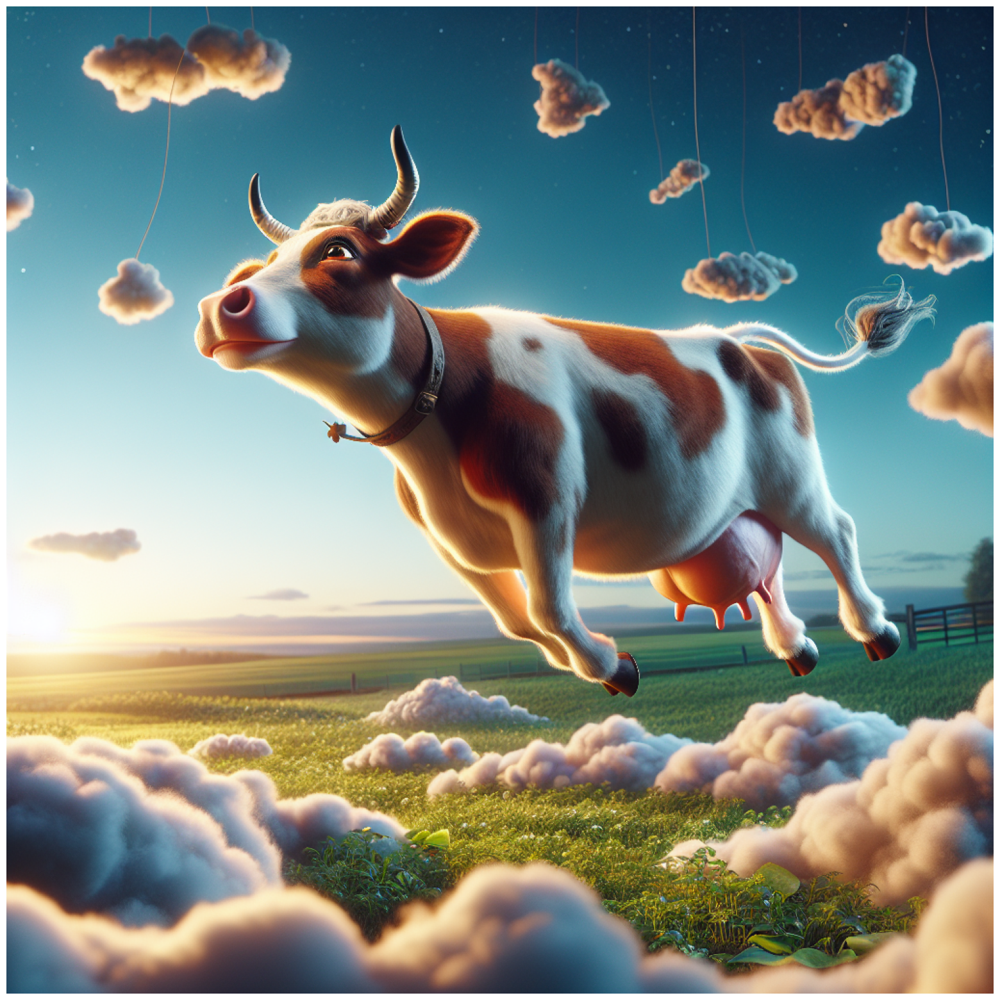

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [10]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

/Users/joshua/Developer/generative-design/.venv/lib/python3.12/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = to

To generate masks, just run `generate` on an image.

In [11]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [12]:
print(len(masks))
print(masks[0].keys())

87
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


Show all the masks overlayed on the image.

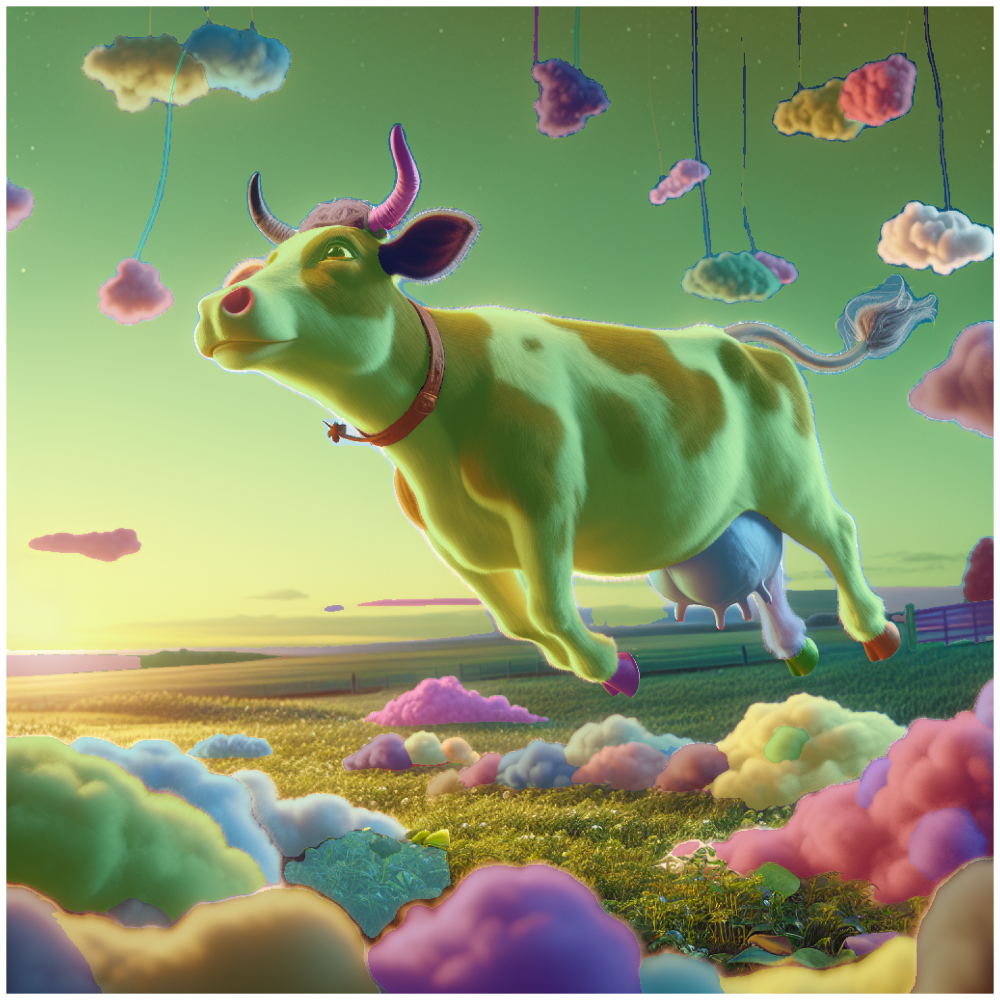

In [13]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [14]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [15]:
masks2 = mask_generator_2.generate(image)

In [16]:
len(masks2)

135

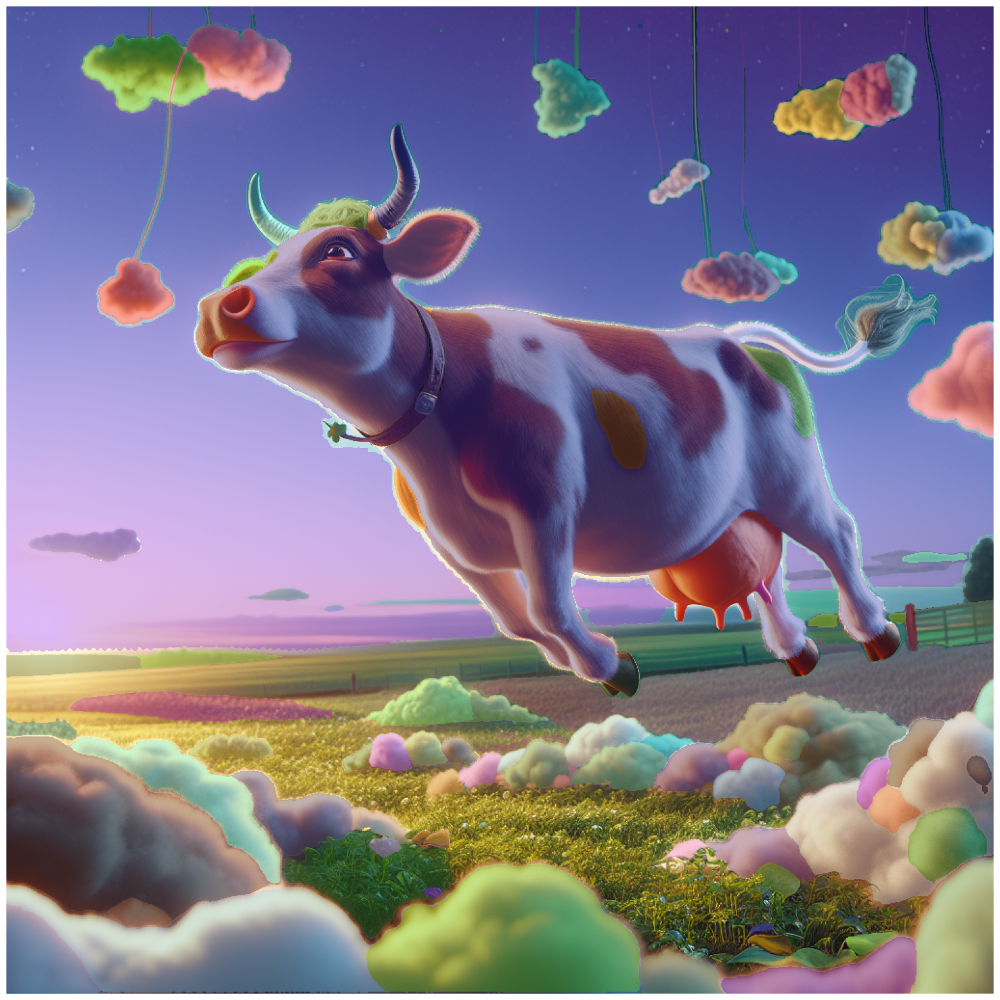

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

## Foreground/Background Segementation

In [ ]:
sorted_anns = sorted(masks2, key=(lambda x: x['area']), reverse=True)

fst = sorted_anns[0]
snd = sorted_anns[1]

# Helper to check if the mask has True values on the boundary
def has_boundary_trues(arr):
    # Check top and bottom rows
    if np.any(arr[0, :]) or np.any(arr[-1, :]):
        return True
    # Check left and right columns
    if np.any(arr[:, 0]) or np.any(arr[:, -1]):
        return True
    return False

# Helper to count the number of True values on the boundary
def count_boundary_trues(mask):
    # Sum True values on top and bottom rows
    top_bottom = np.sum(mask[0, :]) + np.sum(mask[-1, :])
    
    # Sum True values on left and right columns (excluding corners to avoid double counting)
    left_right = np.sum(mask[1:-1, 0]) + np.sum(mask[1:-1, -1])
    
    return int(top_bottom + left_right)

# Helper to calculate the bounding box of the mask
def bounding_box(arr):
    # Find the indices of True values
    true_indices = np.argwhere(arr)
    
    if true_indices.size == 0:
        # If there are no True values, return None or some indicator
        return None
    
    # Get the minimum and maximum row and column indices
    min_row, min_col = true_indices.min(axis=0)
    max_row, max_col = true_indices.max(axis=0)
    
    # Calculate width and height
    width = max_col - min_col + 1
    height = max_row - min_row + 1
    
    # Return in xywh format (x = min_col, y = min_row, width, height)
    return (min_col, min_row, width, height)
    
# Invert masks if they have more boundary True values
inverted_fst = fst.copy()
inverted_fst['segmentation'] = ~inverted_fst['segmentation']
inverted_fst['bbox'] = bounding_box(inverted_fst['segmentation'])

inverted_snd = snd.copy()
inverted_snd['segmentation'] = ~inverted_snd['segmentation']
inverted_snd['bbox'] = bounding_box(inverted_snd['segmentation'])

if count_boundary_trues(inverted_fst['segmentation']) > count_boundary_trues(fst['segmentation']):
    fst = inverted_fst

if count_boundary_trues(inverted_snd['segmentation']) > count_boundary_trues(snd['segmentation']):
    snd = inverted_snd

def select_foreground_by_bounding_box(ann1, ann2):
    _, _, w1, h1 = ann1['bbox']
    _, _, w2, h2 = ann2['bbox']

    # The background mask is likely to have the larger bounding box
    return ann2 if w1 * h1 > w2 * h2 else ann1

foreground_ann = select_foreground_by_bounding_box(fst, snd)



In [60]:
def crop_image(image, xywh):
  x, y, w, h = xywh
  cropped_image = image[y:y+h, x:x+w]
  return cropped_image

# Use original image again (cv2.imread(image_path))
cropped_image = crop_image(cv2.imread(image_path), foreground_ann['bbox'])
cv2.imwrite(f'images/{image_name}_fg.png', cropped_image)

True

In [88]:
import base64
import io
from PIL import Image

def encode_image_from_path(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')

def encode_image(image_array):
    # Convert the NumPy array to a PIL Image
    image = Image.fromarray(image_array.astype('uint8'))

    # Save the image to a bytes buffer
    buffer = io.BytesIO()
    image.save(buffer, format="PNG")
    buffer.seek(0)

    # Encode the image to base64
    return base64.b64encode(buffer.read()).decode('utf-8')

In [47]:
base64_image = encode_image_from_path(f"images/{image_name}_fg.png")

response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "What's in this image? Give your response as a single word or phrase."},
                {
                    "type": "image_url",
                    "image_url": {
                      "url":  f"data:image/jpeg;base64,{base64_image}"
                    }
                },
            ],
        }
    ],
    max_tokens=300,
)

foreground_label = response.choices[0].message.content
print(response.choices[0].message.content)

Flying cow


In [50]:
import matplotlib.patches as patches

def show_foreground(foreground_ann):
    ax = plt.gca()
    ax.set_autoscale_on(False)

    height = foreground_ann['segmentation'].shape[0]
    width = foreground_ann['segmentation'].shape[1]
    img = np.ones((height, width, 4))
    img[:,:,3] = 0

    fg_m = foreground_ann['segmentation']
    bg_m = np.logical_not(fg_m)
    fg_color_mask = np.array([1, 1, 1, 0.8])
    img[fg_m] = fg_color_mask
    bg_color_mask = np.array([0, 0, 0, 0.8])
    img[bg_m] = bg_color_mask

    x, y, w, h = foreground_ann['bbox']
    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    ax.imshow(img)

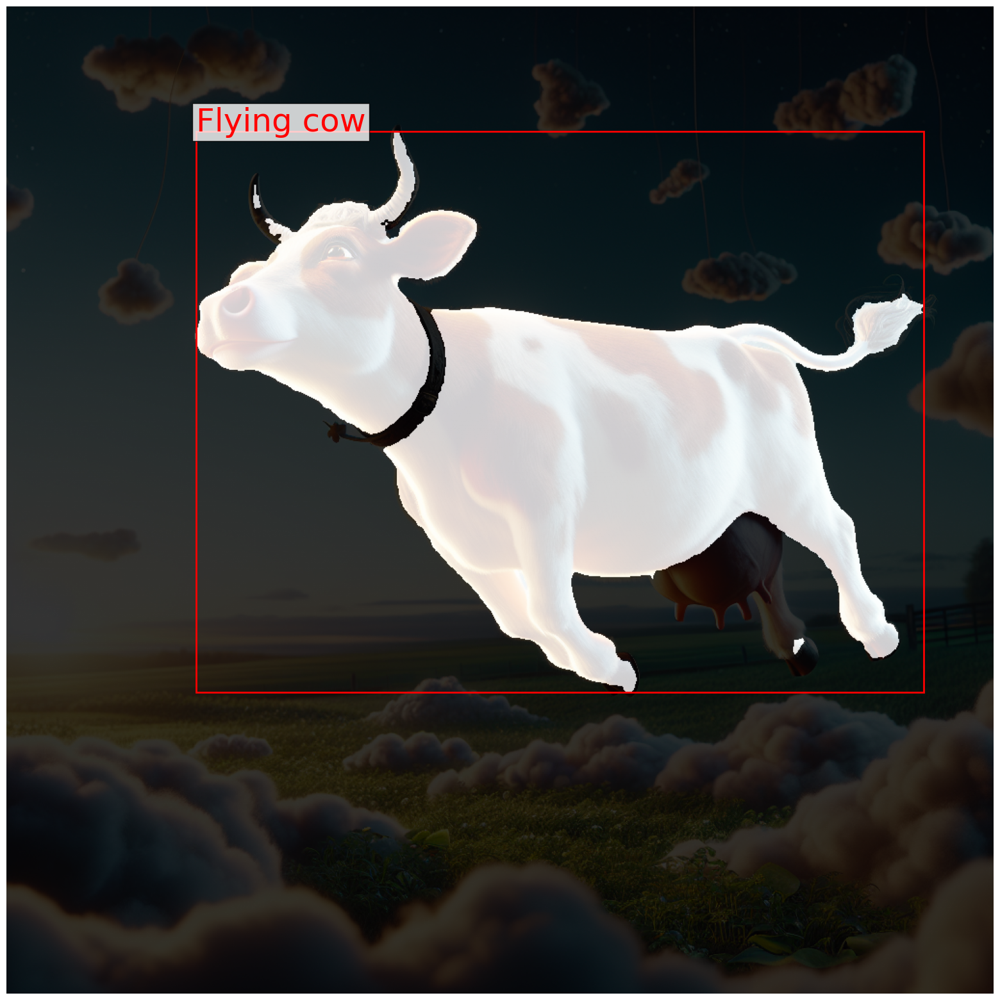

In [133]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_foreground(foreground_ann)
x, y, _, _ = foreground_ann['bbox']
plt.text(x, y, foreground_label, color='red', fontsize=36, bbox=dict(facecolor='white', alpha=0.8))
plt.axis('off')

plt.show()

In [111]:
def normalize_brightness(image):
    """
    Normalize the brightness of an image.
    This function calculates the brightness of each pixel in the image using the luminance formula
    and normalizes the brightness to the range [0, 1].
    Parameters:
    image (numpy.ndarray): A 3D numpy array representing the image, where the third dimension
                           represents the color channels (RGB).
    Returns:
    numpy.ndarray: A 2D numpy array representing the normalized brightness of the image.
    """
    # Calculate the brightness of each pixel using the luminance formula
    brightness = 0.299 * image[:, :, 0] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 2]
    
    # Normalize the brightness to the range [0, 1]
    normalized_brightness = brightness / 255.0
    
    return normalized_brightness

def bucket_brightness(image, num_buckets=10):
    """
    Buckets the brightness of an image into a specified number of buckets.
    Parameters:
    image (numpy.ndarray): The input image whose brightness is to be bucketed.
    num_buckets (int, optional): The number of buckets to divide the brightness into. Default is 10.
    Returns:
    numpy.ndarray: An array of the same shape as the input image, where each pixel value represents the bucket index of the corresponding pixel's brightness.
    """
    # Normalize the brightness
    normalized_brightness = normalize_brightness(image)
    
    # Create the buckets
    buckets = np.linspace(0, 1, num_buckets + 1)
    
    # Calculate the bucket index for each pixel
    bucket_indices = np.digitize(normalized_brightness, buckets, right=True) - 1
    
    return bucket_indices

def create_bucket_masks(bucket_indices):
    """
    Create boolean masks for each unique bucket index.
    Args:
        bucket_indices (numpy.ndarray): An array of bucket indices.
    Returns:
        list of numpy.ndarray: A list of boolean masks, where each mask corresponds to a unique bucket index.
    """
    # Get number of buckets from max index
    num_buckets = np.max(bucket_indices) + 1
    
    # Create a mask for each bucket
    bucket_masks = []
    for i in range(num_buckets):
        mask = bucket_indices == i
        bucket_masks.append(mask)
        
    return bucket_masks

def bucket_to_grayscale(image, num_buckets=10):
    """
    Convert an image to a grayscale image using brightness bucketing.

    Parameters:
    image (numpy.ndarray): The input image to be converted.
    num_buckets (int, optional): The number of brightness buckets to use. Default is 10.

    Returns:
    numpy.ndarray: The resulting grayscale image in RGB format.
    """
    # Get the bucket indices
    bucket_indices = bucket_brightness(image, num_buckets)

    # Map each bucket index to a grayscale value
    grayscale_values = np.linspace(0, 255, num_buckets)
    grayscale_image = grayscale_values[bucket_indices].astype(np.uint8)

    # Expand the grayscale image to have three channels (RGB format)
    grayscale_image_rgb = np.stack([grayscale_image] * 3, axis=-1)

    return grayscale_image_rgb

def create_checkerboard(height, width, square_size=10):
    """
    Generates a checkerboard pattern of the specified dimensions.

    Args:
        height (int): The height of the checkerboard pattern.
        width (int): The width of the checkerboard pattern.
        square_size (int, optional): The size of each square in the checkerboard pattern. Defaults to 10.

    Returns:
        np.ndarray: A 2D boolean array representing the checkerboard pattern, where True indicates a filled square and False indicates an empty square.
    """
    pattern = np.zeros((height, width), dtype=bool)
    for i in range(0, height, square_size * 2):
        for j in range(0, width, square_size * 2):
            pattern[i:i+square_size, j:j+square_size] = True
            if i + square_size < height and j + square_size < width:
                pattern[i+square_size:i+square_size*2, j+square_size:j+square_size*2] = True
    return pattern

def create_diagonal_lines(height, width, line_thickness=2, spacing=10):
    """
    Generates a boolean pattern with diagonal lines.

    Args:
        height (int): The height of the pattern.
        width (int): The width of the pattern.
        line_thickness (int, optional): The thickness of the diagonal lines. Defaults to 2.
        spacing (int, optional): The spacing between the diagonal lines. Defaults to 10.

    Returns:
        np.ndarray: A 2D boolean array representing the pattern with diagonal lines.
    """
    pattern = np.zeros((height, width), dtype=bool)
    for offset in range(-height, width, spacing):
        y = np.arange(height)
        x = offset + y
        mask = (x >= 0) & (x < width)
        y = y[mask]
        x = x[mask]
        for t in range(-line_thickness // 2, line_thickness // 2 + 1):
            y_shifted = y
            x_shifted = x + t
            valid = (x_shifted >= 0) & (x_shifted < width)
            pattern[y_shifted[valid], x_shifted[valid]] = True
    return pattern

def apply_pattern_to_mask(image, mask, pattern_func, **pattern_args):
    """
    Apply a generated pattern to an image based on a mask.
    Parameters:
    image (numpy.ndarray): The input image on which the pattern will be applied.
    mask (numpy.ndarray): A boolean mask indicating where the pattern should be applied.
    pattern_func (function): A function that generates a pattern of the same size as the image.
    pattern_args (dict): Additional arguments to pass to the pattern_func.
    Returns:
    numpy.ndarray: The resulting image with the pattern applied where the mask is True.
    """
    # Create copy of image to modify
    result = image.copy()
    
    # Generate pattern of same size as image
    pattern = pattern_func(image.shape[0], image.shape[1], **pattern_args)
    
    # Apply pattern only where mask is True
    pattern_mask = mask & pattern
    
    # Set pattern pixels to white (255,255,255)
    result[pattern_mask] = [255, 255, 255]
    
    return result

def apply_mask(image, mask):
    """
    Apply a mask to an image, setting pixels where the mask is False to black.
    Parameters:
    image (numpy.ndarray): The input image to which the mask will be applied.
    mask (numpy.ndarray): A boolean array where True values indicate the pixels to keep and False values indicate the pixels to set to black.
    Returns:
    numpy.ndarray: The resulting image after the mask has been applied.
    """
    # Create copy of image
    result = image.copy()
    
    # Set pixels where mask is False to black
    result[~mask] = [0, 0, 0]
    
    return result

def find_contained_masks(masks, encompassing_mask):
    """
    Find masks that are fully contained within an encompassing mask
    Args:
        masks: List of 2D boolean arrays
        encompassing_mask: 2D boolean array that may contain other masks
    Returns:
        List of boolean masks that are fully contained
    """
    contained_masks = []
    
    for mask in masks:
        # Check if all True pixels in mask are also True in encompassing_mask
        # by checking if there are any True pixels in mask that are False in encompassing_mask
        if not np.any(mask & ~encompassing_mask):
            contained_masks.append(mask)
            
    return contained_masks

def label_image(image):
    base64_image = encode_image(image)

    response = client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": "If this is an image of a cloud, reply with lowercase 'cloud'. Otherwise, describe the image in a single word or phrase."},
                    {
                        "type": "image_url",
                        "image_url": {
                        "url":  f"data:image/jpeg;base64,{base64_image}"
                        }
                    },
                ],
            }
        ],
        max_tokens=300,
    )

    foreground_label = response.choices[0].message.content
    return foreground_label

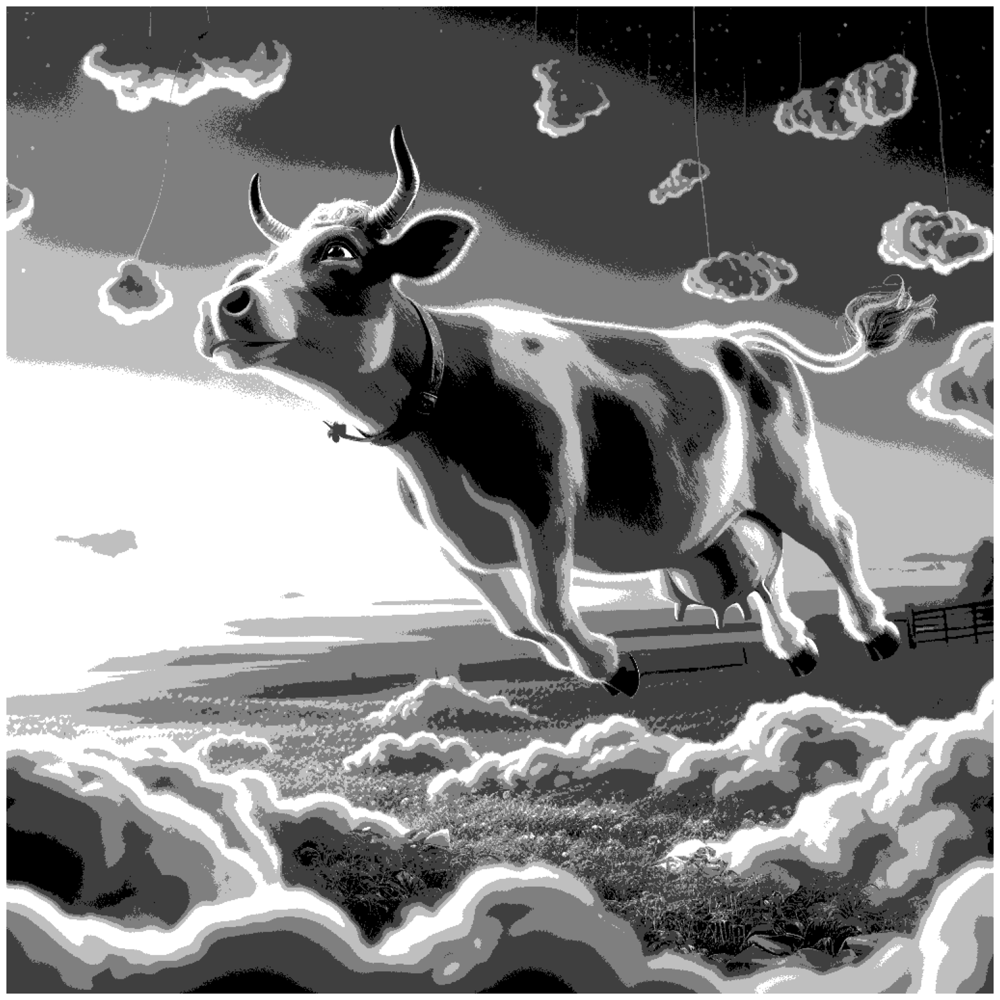

In [113]:

bucketed_grayscale_image = bucket_to_grayscale(cropped_image, num_buckets=5)
cv2.imwrite(f'images/{image_name}_fg_bucketed_grayscale.png', bucketed_grayscale_image)

plt.figure(figsize=(20,20))
plt.imshow(bucketed_grayscale_image)
plt.axis('off')
plt.show()

cow
cloud
cloud
cloud
cloud
cloud
cloud
landscape
cloud
cloud
mushroom
cloud
Floating island
hand
cloud
teeth


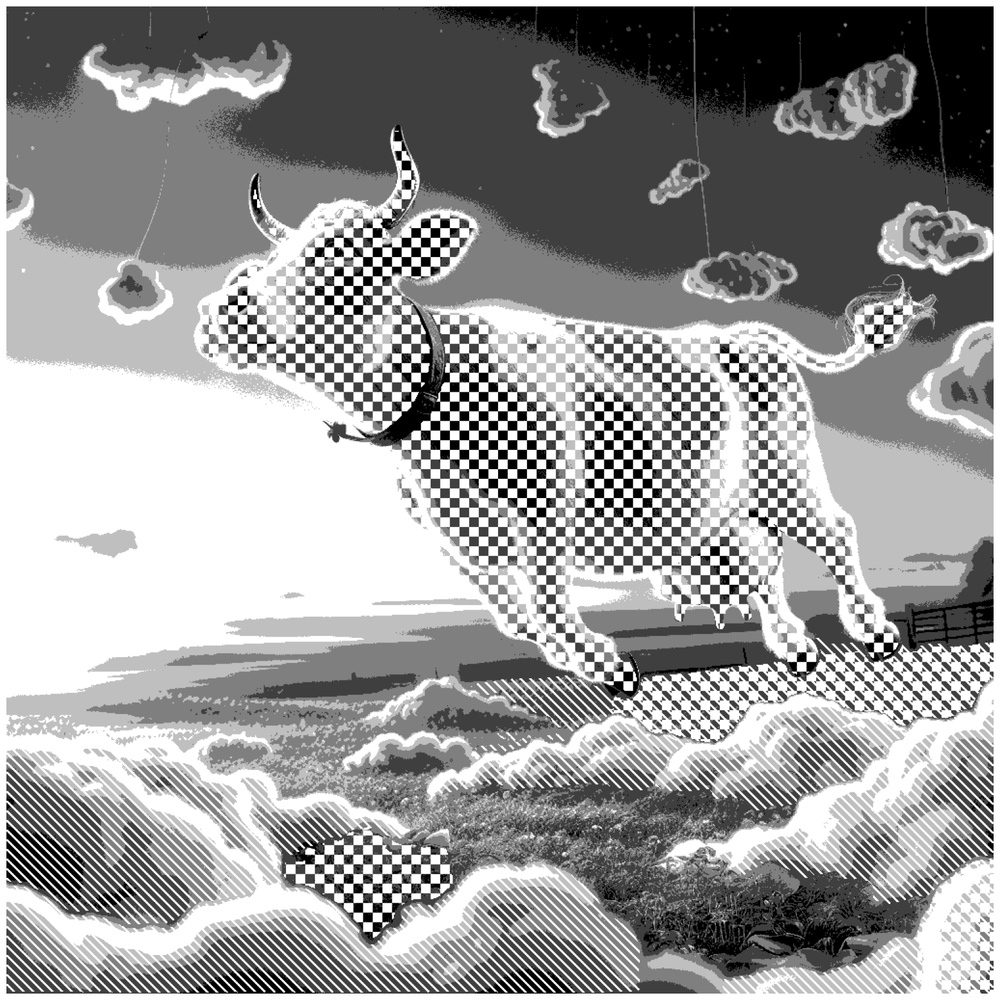

In [134]:
foreground_mask = foreground_ann['segmentation']
masks = list(map(lambda ann: ann['segmentation'], sorted_anns[:20]))
contained_masks = find_contained_masks(masks, foreground_mask)

# Apply patterns to the contained masks
final_image_1 = bucketed_grayscale_image.copy()
for i, mask in enumerate(contained_masks[1:]):
    masked_image = apply_mask(cropped_image, mask)
    cv2.imwrite(f'images/{image_name}_masked_{i}.png', masked_image)
    label = label_image(masked_image)
    print(label)
    if label == 'cloud':
        final_image_1 = apply_pattern_to_mask(final_image_1, mask, create_diagonal_lines)
    else:
        final_image_1 = apply_pattern_to_mask(final_image_1, mask, create_checkerboard)

cv2.imwrite(f'images/{image_name}_fg_bucketed_grayscale_with_masked_pattern.png', final_image)

plt.figure(figsize=(20,20))
plt.imshow(final_image_1)
plt.axis('off')
plt.show()


cow
Cow jumping
cow
surreal cow
Surreal牛


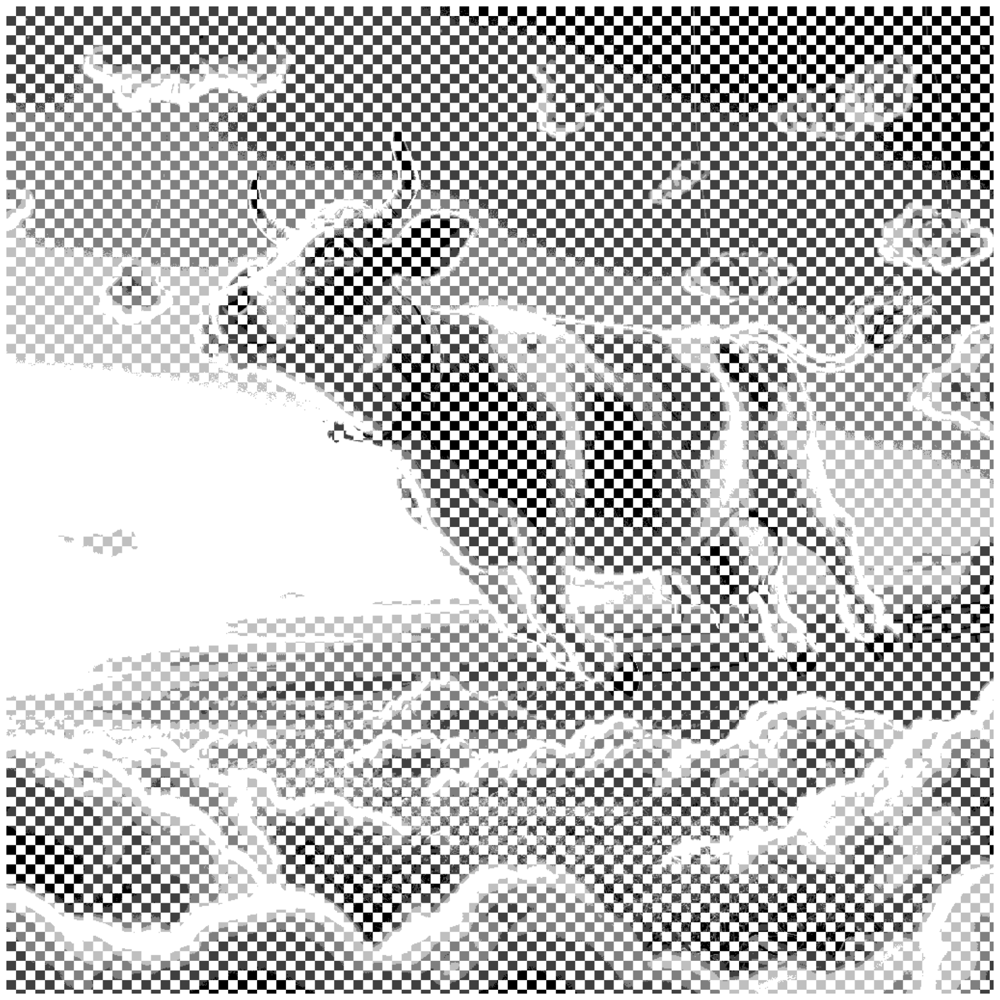

In [117]:
# Apply patterns to the bucketed regions
final_image_2 = bucketed_grayscale_image.copy()
masks = create_bucket_masks(bucket_brightness(cropped_image, num_buckets=5))
for i, mask in enumerate(masks):
    masked_image = apply_mask(cropped_image, mask)
    cv2.imwrite(f'images/{image_name}_masked_{i}.png', masked_image)
    label = label_image(masked_image)
    print(label)
    if label == 'cloud':
        final_image_2 = apply_pattern_to_mask(final_image_2, mask, create_diagonal_lines)
    else:
        final_image_2 = apply_pattern_to_mask(final_image_2, mask, create_checkerboard)

cv2.imwrite(f'images/{image_name}_fg_bucketed_grayscale_with_pattern.png', final_image_2)

plt.figure(figsize=(20,20))
plt.imshow(final_image_2)
plt.axis('off')
plt.show()